# Importing Datasets

In [1]:
# extracting the compressed Dataset
from zipfile import ZipFile
dataset = '/content/Aadhar Detection.zip'

with ZipFile(dataset,'r') as zip:
  zip.extractall()
  print('The dataset is extracted')

The dataset is extracted


In [2]:
!ls

'Aadhar Detection'  'Aadhar Detection.zip'   sample_data


# importing the Dependencies

In [3]:
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import cv2
from google.colab.patches import cv2_imshow
from PIL import Image
import tensorflow as tf

In [4]:
aadhaar = os.listdir('/content/Aadhar Detection/aadhar(1593)')
print(aadhaar[0:5])
print(aadhaar[-5:])

['d85bc8cd45554f5fad2da6298a31e4f3_CKJPP3699F1040346AADHAAR-CARD-120221103_111403_jpg.rf.127e74b9b752f45ef65d4517e53ee186.jpg', '48f8ebc3fb4744859ef3822c5afe8b22_AADPM9422D1027688AADHAAR_CARD-120220907_120501_jpg.rf.87fb7874225fb7fa5b85134ae5045f2a.jpg', '9d8fd1ab8ae6439cba92b9f13126f52f_BDMPJ3778C1076986AADHAAR-CARD-120230203_103941_jpg.rf.1781cae3e927c9798f45a727aa833409.jpg', 'aae53669fe9a407a80634f96ff0f8b0f_FGFPR0903B604686AADHAAR-CARD-120230130_092656_jpg.rf.6abd82b79a59da4c3f4ff9183cb3f2d9.jpg', 'f3b9afe42c794035a07bea43e2c53d01_AWSPG8683R1057935AADHAAR-CARD-120221130_112233_jpg.rf.566e53cc183c69c312db5930801d3b01.jpg']
['a89ed0a7dc834dd7aeb1c5a55c36f37f_ACGPD6908A1033945AADHAAR-CARD-120220923_101601_jpg.rf.889a4cd2c11674c82fab1c8f9fb207c2.jpg', 'd2cf0a83fc3a49f2adc54687a1aec575_AZTPK5230A1045066AADHAAR-CARD-120221025_111040_jpg.rf.a0548363ca75f822cf62665689c25c24.jpg', '18da7595ce044f6382fade1c791e3bfd_AXSPV0651M1024976AADHAAR-CARD-120220830_112258_jpg.rf.52581b5575958bb624098b

In [5]:
non_aadhaar = os.listdir('/content/Aadhar Detection/non_aadhar(544)')
print(non_aadhaar[0:5])
print(non_aadhaar[-5:])

['162.jpg', '172.jpg', '56.jpg', '166.jpg', '112.jpg']
['144.jpg', '174.jpg', '18254a96009f4127b2d277f51eb5608c_frame36_jpg.rf.623f50dc3fa28f8486b2988ab3a523b7.jpg', '170.jpg', '74.jpg']


In [6]:
print("No of Aadhaar images : ",len(aadhaar))
print("No of non_Aadhaar images : ",len(non_aadhaar))

No of Aadhaar images :  1593
No of non_Aadhaar images :  544


# Creating the labels

In [7]:
aadhaar_labels = [1]*1593
non_aadhaar_labels = [0]*544

In [8]:
print(aadhaar_labels[0:5])
print(non_aadhaar_labels[0:5])

[1, 1, 1, 1, 1]
[0, 0, 0, 0, 0]


In [9]:
print(len(aadhaar_labels))
print(len(non_aadhaar_labels))

1593
544


In [10]:
labels = aadhaar_labels + non_aadhaar_labels
print(len(labels))
print(labels[0:5])
print(labels[-5:])

2137
[1, 1, 1, 1, 1]
[0, 0, 0, 0, 0]


# Displaying images

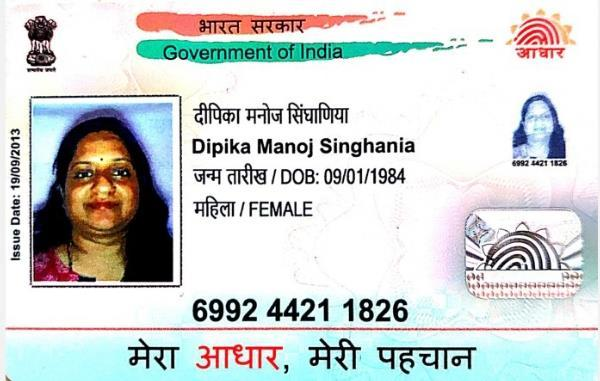

In [11]:
# displaying the Aadhaar image
img = cv2.imread('/content/Aadhar Detection/aadhar(1593)/00d1dc064b2941e1a722709c2325285e_BOVPS6819B1051866AADHAAR-CARD-120221115_125858_jpg.rf.b73fd3c2260f8d0f85df2bbea790b9a6.jpg')
cv2_imshow(img)

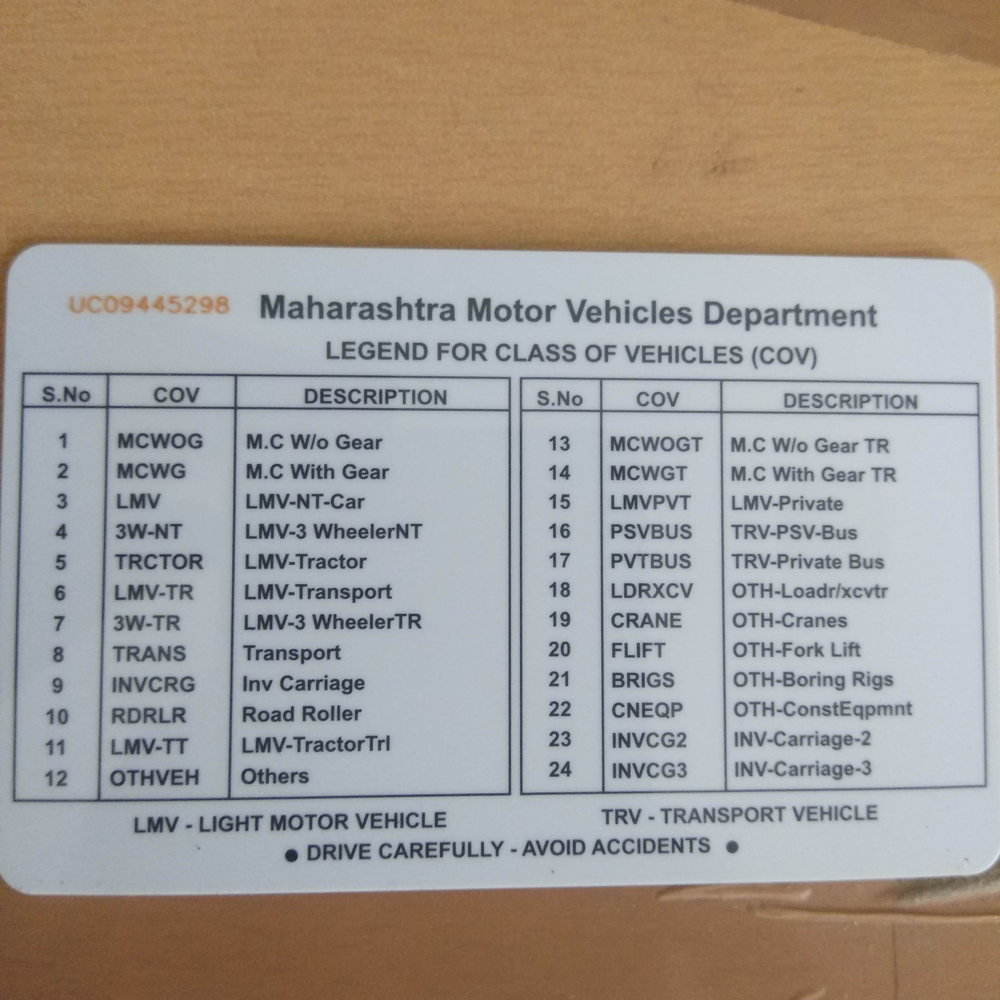

In [12]:
# displaying the non_Aadhaar image
img = cv2.imread('/content/Aadhar Detection/non_aadhar(544)/14.jpg')
cv2_imshow(img)

# Image Processing

In [13]:
# convert images to numpy arrays

data = []

aadhaar_path = '/content/Aadhar Detection/aadhar(1593)'
for img_file in aadhaar:
  image = Image.open(os.path.join(aadhaar_path, img_file))
  image = image.resize((256, 256))
  image = image.convert('RGB')
  image = np.array(image)
  data.append(image)

non_aadhaar_path = '/content/Aadhar Detection/non_aadhar(544)'
for img_file in non_aadhaar:
  image = Image.open(os.path.join(non_aadhaar_path, img_file))
  image = image.resize((256, 256), Image.LANCZOS)
  image = image.convert('RGB')
  image = np.array(image)
  data.append(image)

In [14]:
type(data)

list

In [15]:
print(len(data))

2137


array([[[168, 110,  95],
        [163, 110,  90],
        [163, 116,  88],
        ...,
        [173, 124, 102],
        [177, 126, 105],
        [179, 128, 107]],

       [[169, 112,  95],
        [167, 114,  93],
        [165, 116,  88],
        ...,
        [176, 125, 102],
        [176, 125, 103],
        [178, 126, 104]],

       [[167, 115,  94],
        [173, 119,  95],
        [169, 115,  88],
        ...,
        [180, 127, 103],
        [179, 126, 102],
        [177, 125, 101]],

       ...,

       [[151,  88,  64],
        [148,  90,  70],
        [135,  85,  72],
        ...,
        [185, 135, 108],
        [188, 138, 111],
        [187, 137, 110]],

       [[151,  89,  67],
        [147,  89,  70],
        [134,  83,  69],
        ...,
        [188, 138, 112],
        [189, 139, 112],
        [187, 137, 110]],

       [[151,  90,  69],
        [147,  87,  69],
        [134,  81,  66],
        ...,
        [191, 141, 114],
        [190, 140, 113],
        [188, 138, 111]]], dtype=uint8)
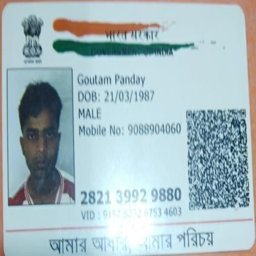

In [16]:
data[0]

In [17]:
type(data[0])

numpy.ndarray

In [18]:
data[0].shape

(256, 256, 3)

In [19]:
# converting the image list and label list to numpy array

X = np.array(data)
y = np.array(labels)

In [20]:
print(X.shape)
print(y.shape)

(2137, 256, 256, 3)
(2137,)


# Splitting the data into Training and Test data

In [21]:
from sklearn.model_selection import train_test_split
X_train , X_test , y_train , y_test = train_test_split(X,y,test_size=0.2,random_state=2)

In [22]:
print (X.shape , X_train.shape , X_test.shape)
print (y.shape , y_train.shape , y_test.shape)

(2137, 256, 256, 3) (1709, 256, 256, 3) (428, 256, 256, 3)
(2137,) (1709,) (428,)


In [23]:
# scaling the data
X_train = X_train/255
X_test  = X_test/255

In [24]:
print(X_train[0])

[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 ...

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.1372549  0.1372549  0.1372549 ]
  [0.01176471 0.01176471 0.01176471]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]


# Building the Convolutional Neural Network

In [25]:
# initializing the cnn
cnn = tf.keras.models.Sequential()

In [26]:
# convolution
cnn.add(tf.keras.layers.Conv2D(filters=32,kernel_size=3,activation='relu',input_shape=[256,256,3]))

/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [27]:
#pooling
cnn.add(tf.keras.layers.MaxPool2D(pool_size=2,strides=2))

In [28]:
#Adding second convolutional layer and pooling
cnn.add(tf.keras.layers.Conv2D(filters=32,kernel_size=3,activation='relu'))
cnn.add(tf.keras.layers.MaxPool2D(pool_size=2,strides=2))

In [29]:
#Flattenning
cnn.add(tf.keras.layers.Flatten())

In [30]:
#Full connection
cnn.add(tf.keras.layers.Dense(units=128,activation='relu'))
cnn.add(tf.keras.layers.Dense(units=64,activation='relu'))

In [31]:
#output layer
cnn.add(tf.keras.layers.Dense(units=2,activation='sigmoid'))

# Training the Convolutional Neural Network

In [32]:
#compiling the cnn
cnn.compile(optimizer='adam',loss='sparse_categorical_crossentropy',metrics=['accuracy'])

In [33]:
#training the neural network on training set and validating on validation split
history = cnn.fit(X_train,y_train,validation_split=0.1,epochs=25)

Epoch 1/25
49/49 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - accuracy: 0.7577 - loss: 1.5907 - val_accuracy: 0.8538 - val_loss: 0.3166
Epoch 2/25
49/49 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - accuracy: 0.9222 - loss: 0.1984 - val_accuracy: 0.9766 - val_loss: 0.0840
Epoch 3/25
49/49 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - accuracy: 0.9773 - loss: 0.0687 - val_accuracy: 0.9766 - val_loss: 0.0981
Epoch 4/25
49/49 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.9737 - loss: 0.0716 - val_accuracy: 0.9649 - val_loss: 0.0895
Epoch 5/25
49/49 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - accuracy: 0.9856 - loss: 0.0307 - val_accuracy: 0.9825 - val_loss: 0.0469
Epoch 6/25
49/49 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - accuracy: 0.9930 - loss: 0.0225 - val_accuracy: 0.9708 - val_loss: 0.0971
Epoch 7/25
49/49 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - accuracy: 0.9987 - loss: 0.0062 - val_accuracy: 0.9766 - val_loss: 0.0646
Epoch 8/25
49/49 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - accuracy: 0.9961 - loss: 0.0103 - val_accuracy: 0.9708 -

# Model Evaluation

In [34]:
loss , accuracy = cnn.evaluate(X_test,y_test)
print("Loss : ",loss)
print("Accuracy : ",accuracy)

14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 89ms/step - accuracy: 0.9720 - loss: 0.1155
Loss :  0.1062965989112854
Accuracy :  0.9766355156898499


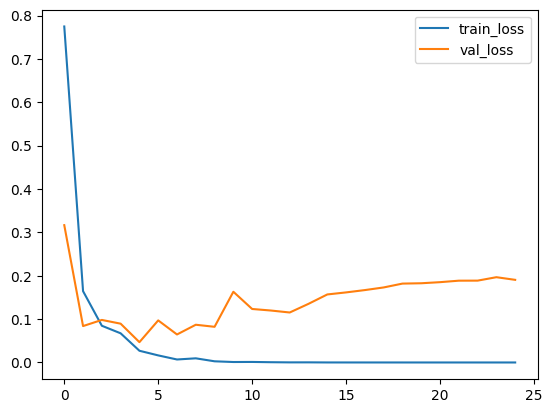

In [35]:
h = history

#plot loss value
plt.plot(h.history['loss'],label='train_loss')
plt.plot(h.history['val_loss'],label='val_loss')
plt.legend()
plt.show()

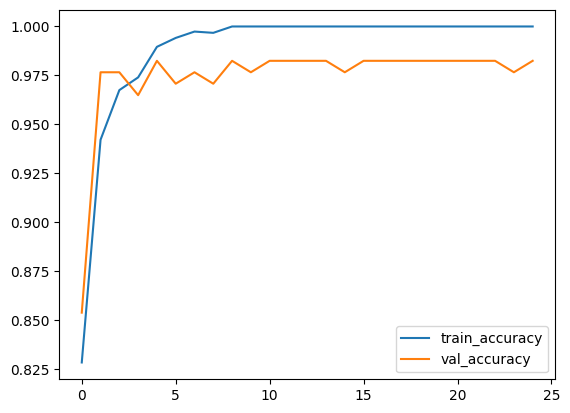

In [36]:
#plot accuracy value
plt.plot(h.history['accuracy'],label='train_accuracy')
plt.plot(h.history['val_accuracy'],label='val_accuracy')
plt.legend()
plt.show()


# Building a predictive system

path of the image to be predicted :/content/Aadhar Detection/aadhar(1593)/0f70105d56f34ebe80abf6c8f45e9ddf_AVQPD8857K1046494AADHAAR-CARD-120221031_111535_jpg.rf.2f34e6e080a499d1b4343b030004cfad.jpg


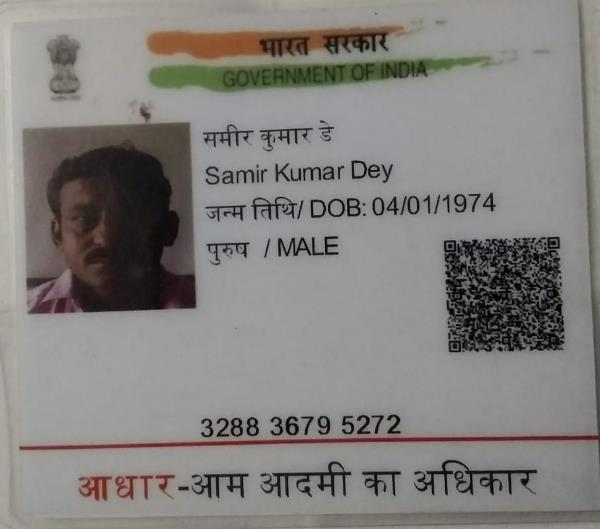

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
[[1.5654156e-04 9.9968153e-01]]
1
This an Aadhaar card


In [42]:
input_image_path = input('path of the image to be predicted :')

input_image = cv2.imread(input_image_path)

cv2_imshow(input_image)

input_image_resized = cv2.resize(input_image,(256,256))

input_image_scaled = input_image_resized/255

input_image_reshaped = np.reshape(input_image_scaled,[1,256,256,3])

input_prediction = cnn.predict(input_image_reshaped)

print(input_prediction)

input_pred_label = np.argmax(input_prediction)

print(input_pred_label)

if input_pred_label == 1:
  print('This an Aadhaar card')
else:
  print('This is not an Aadhaar card')

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

path of the image to be predicted :/content/Aadhar Detection/non_aadhar(544)/157.jpg


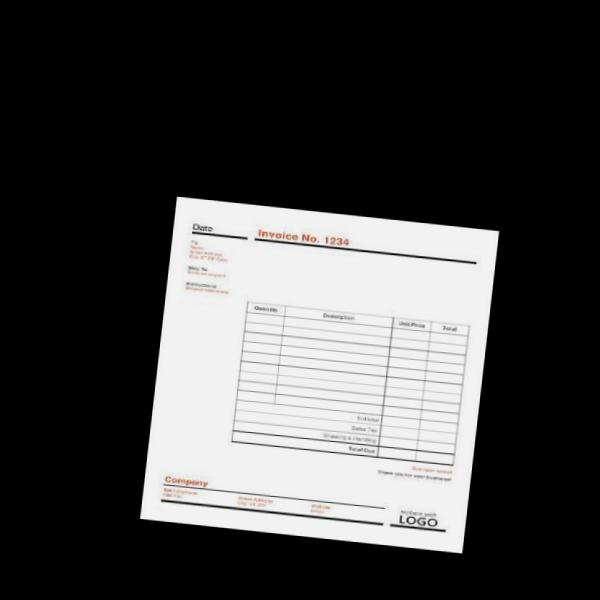

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step
[[9.774665e-01 6.067622e-08]]
0
This not an Aadhaar card


In [41]:
input_image_path = input('path of the image to be predicted :')

input_image = cv2.imread(input_image_path)

cv2_imshow(input_image)

input_image_resized = cv2.resize(input_image,(256,256))

input_image_scaled = input_image_resized/255

input_image_reshaped = np.reshape(input_image_scaled,[1,256,256,3])

input_prediction = cnn.predict(input_image_reshaped)

print(input_prediction)

input_pred_label = np.argmax(input_prediction)

print(input_pred_label)

if input_pred_label == 1:
  print('This an Aadhaar card')
else:
  print('This not an Aadhaar card')